In [0]:
!pip install rasterio

In [0]:
from keras.layers import Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, BatchNormalization, Activation, Input
from keras.utils import Sequence
from keras.layers.merge import concatenate, add
from keras.models import Model
from keras.optimizers import Adam
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import os

Using TensorFlow backend.


In [0]:
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/"My Drive"/spacenet-data/'
image_path_drive = drive_path+'data/'
geojson_path_drive = drive_path+'geojson_roads/'
mask_path_drive = drive_path+'mask/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#copy files using linux cmd
if not os.path.exists('img_data'):
    os.makedirs('img_data')
if not os.path.exists('mask_data'):
    os.makedirs('mask_data')

!rsync -av /content/drive/"My Drive"/spacenet-data/data/SN3_roads_train_AOI_* img_data/
!rsync -av /content/drive/"My Drive"/spacenet-data/mask_lane/SN3_roads_train_AOI_* mask_data/

In [0]:
#single block of the unet model
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
        kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
        x = Activation('relu')(x)

    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
        kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
    return x

In [0]:
#unet model
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
  
    #test = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    c1 = Conv2D(filters = n_filters, kernel_size = (6, 6), strides = (1, 1), padding = 'valid')(input_img)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)

    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)

    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)

    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)

    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)

    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)

    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)

    outputs = Conv2DTranspose(3, (6, 6), strides = (1, 1), padding = 'valid', activation = 'sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

**Custom Loss Function and IOU Score Metric**

In [0]:
from keras import backend as K
from keras import losses

def iou_score(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true,-1) + K.sum(y_pred,-1) - intersection
    iou = (intersection + smooth) / ( union + smooth)
    return iou


def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

#winning solution
def bce_dice_loss_new(y_true, y_pred):
    return 0.8*losses.binary_crossentropy(y_true, y_pred) + 0.2*(1 - dice_loss(y_true, y_pred))

In [0]:
input_layer = Input((325, 325, 8))
model = get_unet(input_layer, n_filters=16, dropout=0.05, batchnorm=True)
model.compile(optimizer=Adam(), loss=bce_dice_loss_new, metrics=[iou_score])

In [0]:
#data loader to load batch of images
class CustomDataGenerator(Sequence):
    def __init__(self, image_list, batch_size, dims, image_path, mask_path):
        self.image_list = image_list
        self.batch_size = batch_size
        self.dims = dims
        self.indexes = np.arange(len(self.image_list))
        self.image_path = image_path
        self.mask_path = mask_path

    def __len__(self):
        return int(np.floor(len(self.image_list) / self.batch_size))

    def __getitem__(self, index):
        batch_list = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]
        batch_image = [self.image_list[i] for i in batch_list]
        x, y = self.__data_generation(batch_image)
        return x, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_list))
        np.random.shuffle(self.indexes)

    def __data_generation(self, batch_image):
        x = np.empty((self.batch_size, self.dims[0], self.dims[1], self.dims[2]))
        y = np.empty((self.batch_size, self.dims[0], self.dims[1], 3))
        try:
            for i, image_name in enumerate(batch_image):
                image = rasterio.open(self.image_path + image_name).read()
                image = np.moveaxis(image, 0, 2)
                mask_name = image_name.replace("MS", "mask")
                mask_name = mask_name.replace("tif", "npy")
                mask = np.load(self.mask_path + mask_name)
                
                x[i,], y[i, ] = image, mask

        except Exception as e:
            print(e)
            pass
        return x, y


Initialize callbacks to save model after each epoch 

In [0]:
from keras.callbacks import ModelCheckpoint

save_model_path = '/content/drive/My Drive/spacenet-data/unet_model_latest.h5'
checkpointer = ModelCheckpoint(filepath=save_model_path, monitor='loss', save_best_only=True, verbose=1)

In [0]:
data = pd.read_csv('/content/drive/My Drive/spacenet-data/image_list.csv')

image_list = data['images']
image_list = image_list.values
np.random.shuffle(image_list)
train_size = int(0.8*image_list.shape[0])
train_list = image_list[0:train_size]
validation_list = image_list[train_size: ]


In [0]:
image_path = 'img_data/'
mask_path = 'mask_data/'
train_generator = CustomDataGenerator(train_list, 32, (325, 325, 8), image_path, mask_path)

In [0]:
#model.fit_generator(train_generator, epochs = 200)
EPOCHS = 500
history = model.fit_generator(train_generator, epochs = EPOCHS, callbacks=[checkpointer])

In [0]:
iou_score_result = history.history['iou_score']
loss_result = history.history['loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, iou_score_result, label='Training IOU Score')
plt.plot(epochs_range, loss_result, label='Training Dice Loss')
plt.legend(loc='upper right')
plt.title('Training Performance')

plt.show()

In [0]:
x_val = np.empty((len(validation_list), 325, 325, 8))
y_val = np.empty((len(validation_list), 325, 325, 3))
for i, image_name in enumerate(validation_list):
    image = rasterio.open(image_path + image_name).read()
    image = np.moveaxis(image, 0, 2)
    mask_name = image_name.replace("MS", "mask")
    mask_name = mask_name.replace("tif", "npy")
    mask = np.load(mask_path + mask_name)
    #mask = mask.reshape(mask.shape[0], mask.shape[1], 1)
    #mask = mask.astype(bool)

    x_val[i,], y_val[i, ] = image, mask

In [0]:
from keras.models import load_model
model = load_model(save_model_path, custom_objects={'bce_dice_loss_new': bce_dice_loss_new, 'iou_score' : iou_score})
predictions = model.predict(x_val)

In [0]:
def show_raster_mask(index):
    fig, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 15))

    raster = rasterio.open(image_path + validation_list[index])
    ax1.imshow(raster.read(1), cmap = 'pink')
    ax1.set_title('Raster Image')
    ax2.imshow(predictions[index])
    ax2.set_title('Predicted Mask')
    ax3.imshow(y_val[index])
    ax3.set_title('Ground Truth')
    plt.show()

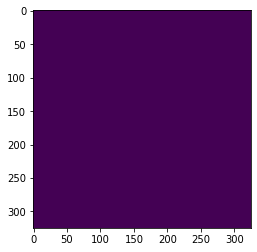

In [0]:
plt.imshow(y_val[0][:, :, 0])

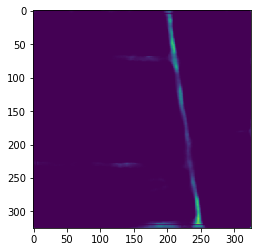

In [0]:
plt.imshow(predictions[0][:, :, 0])

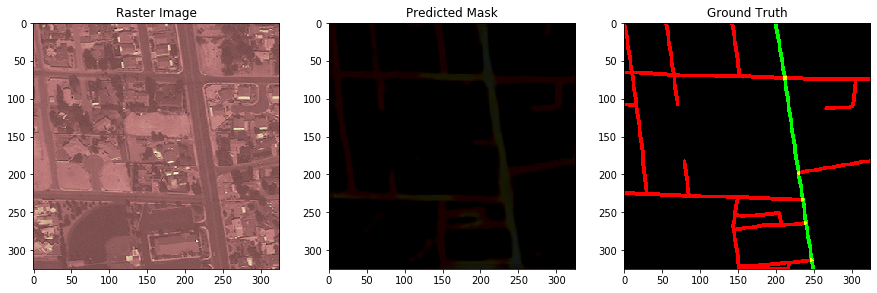

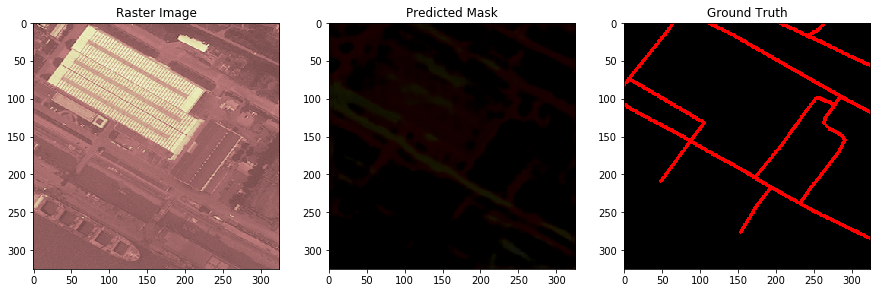

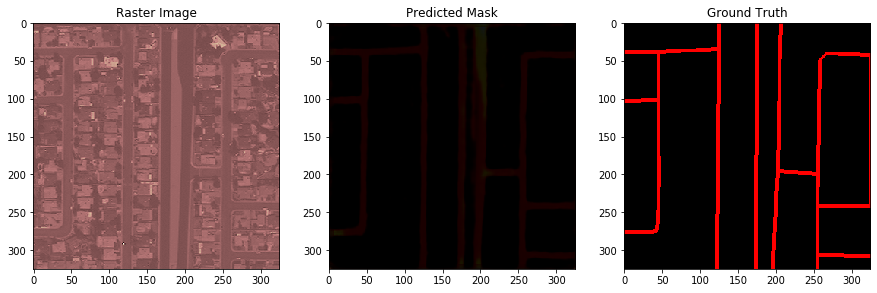

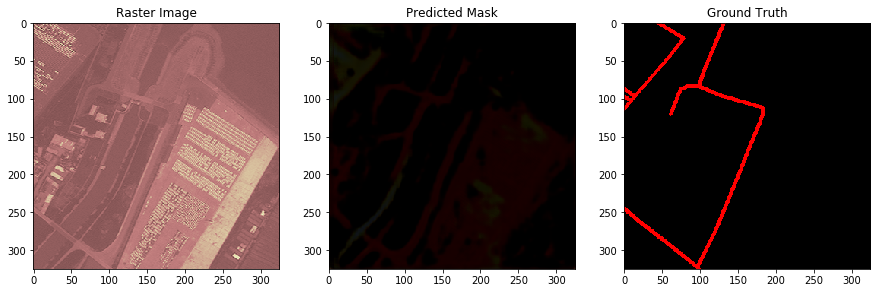

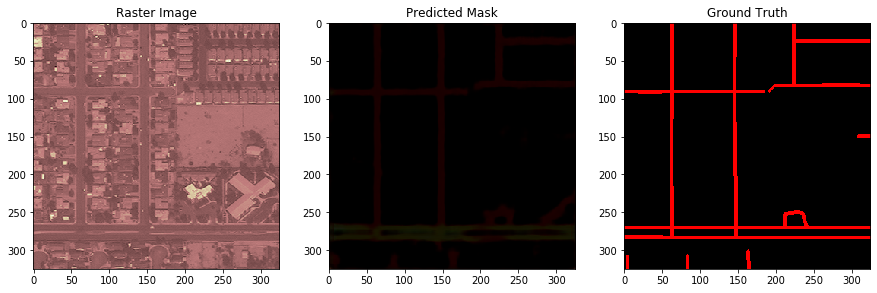

...

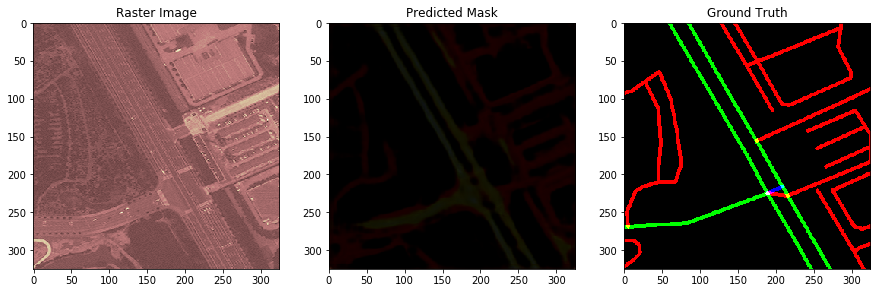

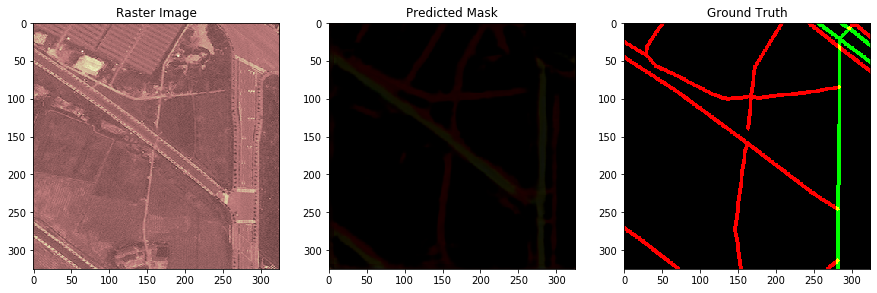

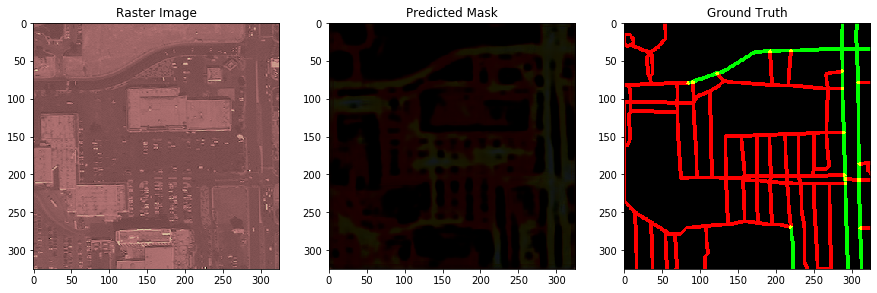

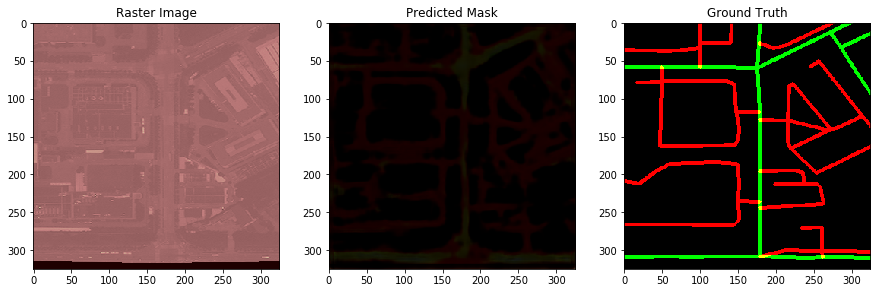

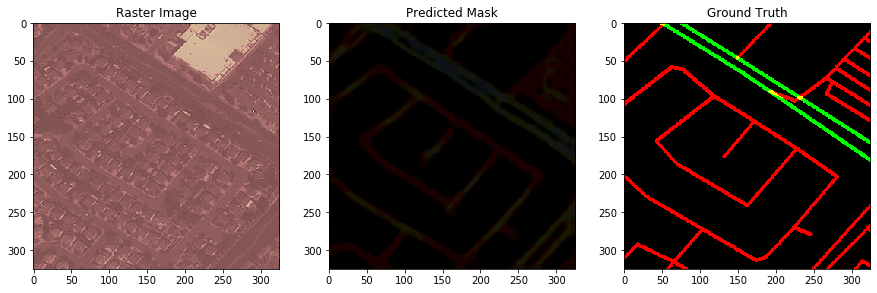

In [0]:
for i in range(80):
    show_raster_mask(i)

In [0]:
def get_road_data(raster_src, mask, threshold):
  lane_1_2_coords = np.argwhere(mask[:, :, 0] > threshold)
  lane_3_4_coords = np.argwhere(mask[:, :, 1] > threshold)
  lane_5_6_coords = np.argwhere(mask[:, :, 2] > threshold)
  lanes = [lane_1_2_coords, lane_3_4_coords, lane_5_6_coords]

  road_data = pd.DataFrame()
  with rasterio.open(raster_src) as map_image:
    for i, lane in enumerate(lanes):
      points = list()
      for coords in lane:
        map_coord = map_image.xy(coords[0], coords[1])
        points.append(map_coord)
      c1 = 'lane '+str(i)+' and '+str(i+1)
      row = {"number_of_lanes":c1, "points": points}
      road_data = road_data.append(row, ignore_index = True)
      

  return road_data